In [1]:
# [Urvi Palvankar]
# [20196232]
# [MMA 2020-2021]
# [2020-2021 (Section 2)]
# [MMA 869]
# [16/08/2020]

# 7. YUM,ORANGE JUICE! - ANSWER TO QUESTION 7 - PART 2

# IMPORTING LIBRARIES

In [2]:
import numpy as np 
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, auc, roc_auc_score, classification_report, confusion_matrix, make_scorer
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn import svm

import pandas_profiling


from sklearn.model_selection import train_test_split

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# READ THE DATA

In [3]:
#Reading the data
df_oj = pd.read_csv("https://raw.githubusercontent.com/stepthom/sandbox/master/data/OJ.csv")

#Vieweing Data to see all the features within the dataset
list(df_oj)
df_oj.shape
df_oj.info()
df_oj.describe().transpose()
df_oj.head(n=10)

['ID',
 'Purchase',
 'WeekofPurchase',
 'StoreID',
 'PriceCH',
 'PriceMM',
 'DiscCH',
 'DiscMM',
 'SpecialCH',
 'SpecialMM',
 'LoyalCH',
 'SalePriceMM',
 'SalePriceCH',
 'PriceDiff',
 'Store7',
 'PctDiscMM',
 'PctDiscCH',
 'ListPriceDiff',
 'STORE']

(1070, 19)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1070 entries, 0 to 1069
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ID              1070 non-null   int64  
 1   Purchase        1070 non-null   object 
 2   WeekofPurchase  1070 non-null   int64  
 3   StoreID         1070 non-null   int64  
 4   PriceCH         1070 non-null   float64
 5   PriceMM         1070 non-null   float64
 6   DiscCH          1070 non-null   float64
 7   DiscMM          1070 non-null   float64
 8   SpecialCH       1070 non-null   int64  
 9   SpecialMM       1070 non-null   int64  
 10  LoyalCH         1070 non-null   float64
 11  SalePriceMM     1070 non-null   float64
 12  SalePriceCH     1070 non-null   float64
 13  PriceDiff       1070 non-null   float64
 14  Store7          1070 non-null   object 
 15  PctDiscMM       1070 non-null   float64
 16  PctDiscCH       1070 non-null   float64
 17  ListPriceDiff   1070 non-null   f

,count,mean,std,min,25%,50%,75%,max
ID,1070.0,535.500000,309.026698,1.000000,268.250000,535.50,802.750000,1070.000000
WeekofPurchase,1070.0,254.381308,15.558286,227.000000,240.000000,257.00,268.000000,278.000000
StoreID,1070.0,3.959813,2.308984,1.000000,2.000000,3.00,7.000000,7.000000
PriceCH,1070.0,1.867421,0.101970,1.690000,1.790000,1.86,1.990000,2.090000
PriceMM,1070.0,2.085411,0.134386,1.690000,1.990000,2.09,2.180000,2.290000
DiscCH,1070.0,0.051860,0.117474,0.000000,0.000000,0.00,0.000000,0.500000
DiscMM,1070.0,0.123364,0.213834,0.000000,0.000000,0.00,0.230000,0.800000
SpecialCH,1070.0,0.147664,0.354932,0.000000,0.000000,0.00,0.000000,1.000000
SpecialMM,1070.0,0.161682,0.368331,0.000000,0.000000,0.00,0.000000,1.000000
LoyalCH,1070.0,0.565782,0.307843,0.000011,0.325257,0.60,0.850873,0.999947


,ID,Purchase,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,PctDiscMM,PctDiscCH,ListPriceDiff,STORE
0,1,CH,237,1,1.75,1.99,0.00,0.0,0,0,0.500000,1.99,1.75,0.24,No,0.000000,0.000000,0.24,1
1,2,CH,239,1,1.75,1.99,0.00,0.3,0,1,0.600000,1.69,1.75,-0.06,No,0.150754,0.000000,0.24,1
2,3,CH,245,1,1.86,2.09,0.17,0.0,0,0,0.680000,2.09,1.69,0.40,No,0.000000,0.091398,0.23,1
3,4,MM,227,1,1.69,1.69,0.00,0.0,0,0,0.400000,1.69,1.69,0.00,No,0.000000,0.000000,0.00,1
4,5,CH,228,7,1.69,1.69,0.00,0.0,0,0,0.956535,1.69,1.69,0.00,Yes,0.000000,0.000000,0.00,0
5,6,CH,230,7,1.69,1.99,0.00,0.0,0,1,0.965228,1.99,1.69,0.30,Yes,0.000000,0.000000,0.30,0
6,7,CH,232,7,1.69,1.99,0.00,0.4,1,1,0.972182,1.59,1.69,-0.10,Yes,0.201005,0.000000,0.30,0
7,8,CH,234,7,1.75,1.99,0.00,0.4,1,0,0.977746,1.59,1.75,-0.16,Yes,0.201005,0.000000,0.24,0
8,9,CH,235,7,1.75,1.99,0.00,0.4,0,0,0.982197,1.59,1.75,-0.16,Yes,0.201005,0.000000,0.24,0
9,10,CH,238,7,1.75,1.99,0.00,0.4,0,0,0.985757,1.59,1.75,-0.16,Yes,0.201005,0.000000,0.24,0


# Data Cleaning and Feature Engineering

In [4]:
#Dropping the first column(ID) as it is nothing but row#
df_oj = df_oj.drop(['ID'],axis=1)

In [5]:
#Converting some columns into factors:Since these columns cannot be interpretted as numerical values
#Store ID's (range from 1 to 7) and has no numerical significance hence converted it into factor/object variable
#STORE feature (ranges from 1 to 5) states which of 5 possible stores the sale occured at and has no numerical significance and hence converted it into object

df_oj['StoreID'] = df_oj['StoreID'].astype(object)
df_oj['STORE'] = df_oj['STORE'].astype(object)

from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()

#Assigning numerical values to the categorical features 
#Purchase is the target varibale but is in categorical form - it is easier to run it through algorithms in numerical form
#Store 7 is a factor with levels No and Yes indicating whether the sale is at Store 7 - Converted this feature into numerical form as it is easier to read
df_oj['Purchase'] = labelencoder.fit_transform(df_oj['Purchase'])
df_oj['Store7'] = labelencoder.fit_transform(df_oj['Store7'])

df_oj
df_oj.info()

,Purchase,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,PctDiscMM,PctDiscCH,ListPriceDiff,STORE
0,0,237,1,1.75,1.99,0.00,0.00,0,0,0.500000,1.99,1.75,0.24,0,0.000000,0.000000,0.24,1
1,0,239,1,1.75,1.99,0.00,0.30,0,1,0.600000,1.69,1.75,-0.06,0,0.150754,0.000000,0.24,1
2,0,245,1,1.86,2.09,0.17,0.00,0,0,0.680000,2.09,1.69,0.40,0,0.000000,0.091398,0.23,1
3,1,227,1,1.69,1.69,0.00,0.00,0,0,0.400000,1.69,1.69,0.00,0,0.000000,0.000000,0.00,1
4,0,228,7,1.69,1.69,0.00,0.00,0,0,0.956535,1.69,1.69,0.00,1,0.000000,0.000000,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,0,252,7,1.86,2.09,0.10,0.00,0,0,0.587822,2.09,1.76,0.33,1,0.000000,0.053763,0.23,0
1066,0,256,7,1.86,2.18,0.00,0.00,0,0,0.670258,2.18,1.86,0.32,1,0.000000,0.000000,0.32,0
1067,1,257,7,1.86,2.18,0.00,0.00,0,0,0.736206,2.18,1.86,0.32,1,0.000000,0.000000,0.32,0
1068,0,261,7,1.86,2.13,0.00,0.24,0,0,0.588965,1.89,1.86,0.03,1,0.112676,0.000000,0.27,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1070 entries, 0 to 1069
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Purchase        1070 non-null   int32  
 1   WeekofPurchase  1070 non-null   int64  
 2   StoreID         1070 non-null   object 
 3   PriceCH         1070 non-null   float64
 4   PriceMM         1070 non-null   float64
 5   DiscCH          1070 non-null   float64
 6   DiscMM          1070 non-null   float64
 7   SpecialCH       1070 non-null   int64  
 8   SpecialMM       1070 non-null   int64  
 9   LoyalCH         1070 non-null   float64
 10  SalePriceMM     1070 non-null   float64
 11  SalePriceCH     1070 non-null   float64
 12  PriceDiff       1070 non-null   float64
 13  Store7          1070 non-null   int32  
 14  PctDiscMM       1070 non-null   float64
 15  PctDiscCH       1070 non-null   float64
 16  ListPriceDiff   1070 non-null   float64
 17  STORE           1070 non-null   o

In [6]:
#Feature Engineering - Scaling the numerical features
#Scaling Data - Standardization 
#Data is scaled so that all numbers can be viewed at one standard level

#First step - remove "target variable" from data as we do not need to scale target variable
X = df_oj.copy()
X = X.drop(['Purchase'],axis=1)

#Scaling the numerical features
scaler = StandardScaler()
features = list(X.select_dtypes(include=np.number).columns)
X[features] = scaler.fit_transform(X[features])

#Adding taregt variable purchase back to the scaled data
X['Purchase']=df_oj['Purchase']

df_oj=X.copy()
df_oj

,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,PctDiscMM,PctDiscCH,ListPriceDiff,STORE,Purchase
0,-1.117696,1,-1.152062,-0.710313,-0.441664,-0.577188,-0.416228,-0.439164,-0.213788,0.110671,-0.457454,0.344516,-0.706116,-0.583001,-0.439106,0.204766,1,0
1,-0.989087,1,-1.152062,-0.710313,-0.441664,0.826428,-0.416228,2.277053,0.111205,-1.077075,-0.457454,-0.760718,-0.706116,0.899158,-0.439106,0.204766,1,0
2,-0.603260,1,-0.072806,0.034162,1.006140,-0.577188,-0.416228,-0.439164,0.371200,0.506587,-0.876108,0.933974,-0.706116,-0.583001,1.030237,0.111730,1,0
3,-1.760741,1,-1.740747,-2.943741,-0.441664,-0.577188,-0.416228,-0.439164,-0.538781,-1.077075,-0.876108,-0.539671,-0.706116,-0.583001,-0.439106,-2.028100,1,1
4,-1.696437,7,-1.740747,-2.943741,-0.441664,-0.577188,-0.416228,-0.439164,1.269920,-1.077075,-0.876108,-0.539671,1.416198,-0.583001,-0.439106,-2.028100,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,-0.153129,7,-0.072806,0.034162,0.409985,-0.577188,-0.416228,-0.439164,0.071627,0.506587,-0.387678,0.676086,1.416198,-0.583001,0.425205,0.111730,0,0
1066,0.104089,7,-0.072806,0.704191,-0.441664,-0.577188,-0.416228,-0.439164,0.339539,0.862910,0.310078,0.639245,1.416198,-0.583001,-0.439106,0.949055,0,0
1067,0.168394,7,-0.072806,0.704191,-0.441664,-0.577188,-0.416228,-0.439164,0.553866,0.862910,0.310078,0.639245,1.416198,-0.583001,-0.439106,0.949055,0,1
1068,0.425612,7,-0.072806,0.331953,-0.441664,0.545705,-0.416228,-0.439164,0.075342,-0.285244,0.310078,-0.429148,1.416198,0.524789,-0.439106,0.483875,0,0


In [7]:
#Using Pandas Profiling to get a deeper view into the data 
#Missing Vlaues, All Feature interactions, correlations are captured using pandas profiling

pandas_profiling.ProfileReport(df_oj)

# Splitting Data into Train, Test

In [8]:
#Splitting data into train and test
#The main reason why we split the data into train and test set is to check how well our model will perform on data it has never seen before
#The performance on test data will give us an idea of how the model will perorm in the furture on unseen data

#I Have used stratified sampling method for splitting the dataset into train and test data
#The reason why i used stratified sampling is as follows:
#Stratified sampling ensures that the train and test sets have approximately the same percentage of samples of each target class as the complete set.
y = df_oj['Purchase']
X = df_oj.drop(columns = 'Purchase')
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.20, stratify=y, random_state=42)
X_train.shape
X_test.shape
y_train.shape
y_test.shape

(856, 17)

(214, 17)

(856,)

(214,)

# Creating Performace Metrics

In [9]:
# ROC curve
def plot_roc(y_test, y_pred):
    fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=1, drop_intermediate = False)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([-0.001, 1.001])
    plt.ylim([-0.001, 1.001])
    plt.xlabel('1-Specificity (False Negative Rate)')
    plt.ylabel('Sensitivity (True Positive Rate)')
    plt.title('ROC curve')
    plt.legend(loc="lower right")
    plt.show()

# Confusion Matrix returns in the format: cm[0,0], cm[0,1], cm[1,0], cm[1,1]: tn, fp, fn, tp

# Sensitivity
def custom_sensitivity_score(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    return (tp/(tp+fn))

# Specificity
def custom_specificity_score(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    return (tn/(tn+fp))

# Positive Predictive Value
def custom_ppv_score(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    return (tp/(tp+fp))

# Negative Predictive Value
def custom_npv_score(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    return (tn/(tn+fn))

# Accuracy
def custom_accuracy_score(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    return ((tn+tp)/(tn+tp+fn+fp))

# CLASSIFICATION MODELS

# 1. Random Forest

## Grid Search for Hyper Paramter tuning with Cross Validation

In [10]:
#Grid Search with cross validation

#Score_func defines the performance measure(auc) which the gridsearchCV should use
score_func = make_scorer(roc_auc_score, greater_is_better=True)

# Create a parameter grid to test various hyper parameter values
param_grid_rf = {
    'max_depth': [80, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [50, 100, 300]
}

# Defining the Random Forest Classifier model
classifier_RF = RandomForestClassifier(random_state=77300)

# Hyper-parameter tuning ("optimization") using the function GridSearchCV for maximizing AUC
# 5-fold cross-validation
# Instantiate the grid search model
grid_search_rf = GridSearchCV(estimator = classifier_RF, param_grid = param_grid_rf, 
                          cv = 5, scoring = score_func, return_train_score = True)

## Fitting the Model

In [11]:
#Fitting the model to the training dataset
grid_search_RF = grid_search_rf.fit(X_train, y_train)

## Best Hyper-Parameter Values

In [26]:
#Finding out which are the best hyper parameter values where auc for the model is highest
print('\nBest Hyper-Parameter values Random Forest:'+str(grid_search_RF.best_params_))
grid_search_RF.best_params_

#Best Estimator for Random Forest Model
best_grid_rf = grid_search_RF.best_estimator_
best_grid_rf

#Score of the best model
best_result_rf = grid_search_RF.best_score_
print("\nBest Score Random Forest: " + str(best_result_rf))

Best Hyper-Parameter values Random Forest:{'max_depth': 80, 'max_features': 3, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}


{'max_depth': 80,
 'max_features': 3,
 'min_samples_leaf': 4,
 'min_samples_split': 10,
 'n_estimators': 100}

RandomForestClassifier(max_depth=80, max_features=3, min_samples_leaf=4,
                       min_samples_split=10, random_state=77300)

Best Score Random Forest: 0.8039782356946537


## Using the Best Model to predict testing data

In [13]:
#Using the above (best) model with the best hyper parameter values to predict the testing data
class_threshold = 0.50
y_pred_prob_rf = grid_search_RF.predict_proba(X_test)[:,1]
y_pred_rf = np.where(y_pred_prob_rf > class_threshold, 1, 0) # classification

## Performance Measure

Confusion matrix Random Forest: 
[[118  21]
 [ 13  62]]

 AUC Random Forest: 0.9118918421778718


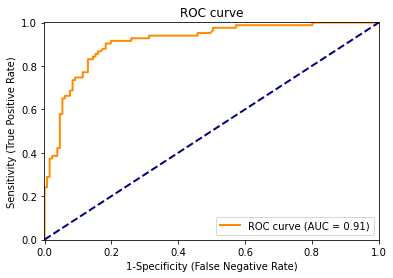

                                   Accuracy Random Forest: 0.8411214953271028
                   SENSITIVITY (aka RECALL) Random Forest: 0.7469879518072289
                 SPECIFICITY (aka FALL-OUT) Random Forest: 0.9007633587786259
 POSITIVE PREDICTIVE VALUE, (aka PRECISION) Random Forest: 0.8266666666666667
                 NEGATIVE PREDICTIVE VALUE) Random Forest: 0.8489208633093526


In [14]:
## Performance Measure

#Confusion Matrix
cm_rf = np.transpose(confusion_matrix(y_test, y_pred_rf))
print("\nConfusion matrix Random Forest: \n" + str(cm_rf))

#Auc Calculation
auc_rf=roc_auc_score(y_test, y_pred_prob_rf)
print("\nAUC Random Forest: " +str(auc_rf))

#ROC plot
plot_roc(y_test, y_pred_prob_rf)

#Other Performance Metrics
print("                                   Accuracy Random Forest: " + str(custom_accuracy_score(y_test, y_pred_rf))) 
print("                   SENSITIVITY (aka RECALL) Random Forest: " + str(custom_sensitivity_score(y_test, y_pred_rf)))
print("                 SPECIFICITY (aka FALL-OUT) Random Forest: " + str(custom_specificity_score(y_test, y_pred_rf)))
print(" POSITIVE PREDICTIVE VALUE, (aka PRECISION) Random Forest: " + str(custom_ppv_score(y_test, y_pred_rf)))
print("                 NEGATIVE PREDICTIVE VALUE) Random Forest: " + str(custom_npv_score(y_test, y_pred_rf)))

## Feature Importance Plot

<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Feature Importance Random Forest')

Text(0.5, 0, 'Decrease in Gini (recal, Gini = 2*AUC-1)')

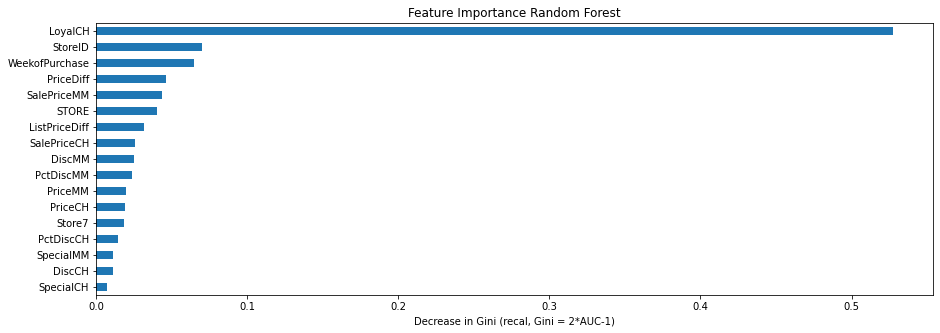

In [15]:
#Feature Importance - Using Random Forest Model
importances = grid_search_RF.best_estimator_.feature_importances_ 

#Plot the varibales according to their importance
plt.figure(figsize=(15,5))
plt.title('Feature Importance Random Forest')
plt.xlabel('Decrease in Gini (recal, Gini = 2*AUC-1)')
feature_importances = pd.Series(grid_search_RF.best_estimator_.feature_importances_ , index=X_train.columns)
feature_importances.nlargest(17).sort_values().plot(kind='barh', align='center')

# 2. Gradient Boosting Machine (XGBOOST)

## Grid Search for Hyper Paramter tuning with Cross Validation¶

In [16]:
#Define the gradient boosting model
classifier_GBM = GradientBoostingClassifier(random_state=77300)

#Score_func defines the performance measure(auc) which the gridsearchCV should use
score_func = make_scorer(roc_auc_score, greater_is_better=True)

#Create a parameter grid to test various hyper parameter values
param_grid_gbm = {
    'n_estimators': [100, 200, 500],
    'learning_rate': [0.01, 0.025, 0.05, 0.075, 0.1],
    "max_depth":[3,5,8]
}

# Hyper-parameter tuning ("optimization") using the function GridSearchCV for maximizing AUC
#5-fold cross-validation
# Instantiate the grid search model
grid_search_gbm = GridSearchCV(estimator = classifier_GBM, cv = 5, param_grid = param_grid_gbm, scoring = score_func,
                              return_train_score = True) 

## Fitting the Model

In [17]:
#Fitting the model to the training dataset
grid_search_GBM = grid_search_gbm.fit(X_train, y_train)

## Best Hyper-Parameter Values

In [18]:
#Finding out which are the best hyper parameter values where auc for the model is highest
print('\nBest Hyper-Parameter values Gradient Boosting:' + str(grid_search_GBM.best_params_)) 
grid_search_GBM.best_params_

#Best Estimator for Gradient Boosting Model
best_grid_gbm = grid_search_GBM.best_estimator_
best_grid_gbm

#Viweing the best score of the model
best_result_gbm = grid_search_GBM.best_score_
print("\nBest Score Gradient Boosting: " + str(best_result_gbm))

Best Hyper-Parameter values Gradient Boosting:{'learning_rate': 0.025, 'max_depth': 3, 'n_estimators': 100}


{'learning_rate': 0.025, 'max_depth': 3, 'n_estimators': 100}

GradientBoostingClassifier(learning_rate=0.025, random_state=77300)

Best Score Gradient Boosting: 0.8084177017012838


## Using the Best Model to predict testing data

In [19]:
#Using the above (best) model with the best hyper parameter values to predict the testing data
class_threshold=0.50
y_pred_prob_gbm = grid_search_GBM.predict_proba(X_test)[:,1] # probabilities
y_pred_gbm = np.where(y_pred_prob_gbm > class_threshold, 1, 0) # classification

## Performace Measures

Confusion matrix Gradient Boosting: 
[[118  23]
 [ 13  60]]

 AUC Gradient Boosting:0.925273613538122


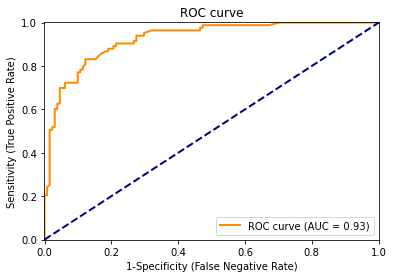

                                   Accuracy Gradient Boosting: 0.8317757009345794
                   SENSITIVITY (aka RECALL) Gradient Boosting: 0.7228915662650602
                 SPECIFICITY (aka FALL-OUT) Gradient Boosting: 0.9007633587786259
 POSITIVE PREDICTIVE VALUE, (aka PRECISION) Gradient Boosting: 0.821917808219178
                 NEGATIVE PREDICTIVE VALUE) Gradient Boosting: 0.8368794326241135


In [20]:
## Performance Measures

#Confusion Matrix
cm_gbm= np.transpose(confusion_matrix(y_test, y_pred_gbm))
print("\nConfusion matrix Gradient Boosting: \n" + str(cm_gbm))

#Auc Calculation
auc_gbm=roc_auc_score(y_test, y_pred_prob_gbm)
print("\nAUC Gradient Boosting:" + str(auc_gbm))

#ROC plot
plot_roc(y_test, y_pred_prob_gbm)

#Other Performance Metrics
print("                                   Accuracy Gradient Boosting: " + str(custom_accuracy_score(y_test, y_pred_gbm))) 
print("                   SENSITIVITY (aka RECALL) Gradient Boosting: " + str(custom_sensitivity_score(y_test, y_pred_gbm)))
print("                 SPECIFICITY (aka FALL-OUT) Gradient Boosting: " + str(custom_specificity_score(y_test, y_pred_gbm)))
print(" POSITIVE PREDICTIVE VALUE, (aka PRECISION) Gradient Boosting: " + str(custom_ppv_score(y_test, y_pred_gbm)))
print("                 NEGATIVE PREDICTIVE VALUE) Gradient Boosting: " + str(custom_npv_score(y_test, y_pred_gbm)))

# SVM Model

## Grid Search for Hyper Paramter tuning with Cross Validation

In [21]:
#Grid Search with cross validation

#Score_func defines the performance measure with which the gridsearchCV should use
score_func = make_scorer(roc_auc_score, greater_is_better=True)

# Create the parameter grid to test various hyper parameters
param_grid_svm = {'kernel': ['rbf'], 'gamma': [0.001, 0.01,0.1],
                     'C': [1, 10, 100, 1000]}
    
#Define the SVM model
svm_model = svm.SVC(probability=True,random_state=77300)

# Hyper-parameter tuning ("optimization") using the function GridSearchCV for maximizing AUC
#5-fold cross-validation
# Instantiate the grid search model
grid_search_svm = GridSearchCV(estimator = svm_model, param_grid = param_grid_svm, 
                          cv = 5, scoring = score_func, return_train_score = True)

## Fitting the Model

In [22]:
#Fitting the model to training data
grid_search_SVM = grid_search_svm.fit(X_train, y_train)

## Best Hyper-Parameter Values

In [23]:
#Finding out which are the best hyper parameter values where auc for the model is highest
print('\nBest Hyper-Parameter values SVM:' + str(grid_search_SVM.best_params_)) 
grid_search_SVM.best_params_

#Best Estimator for SVM Model
best_grid_svm = grid_search_SVM.best_estimator_
best_grid_svm

#Viweing the best score of the model
best_result_svm = grid_search_SVM.best_score_
print("\nBest Score SVM: "+str(best_result_svm))

Best Hyper-Parameter values SVM:{'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}


{'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}

SVC(C=10, gamma=0.001, probability=True, random_state=77300)

Best Score SVM: 0.808491918529232


## Using the Best Model to predict testing data¶

In [24]:
#Using the above (best) model with the best hyper parameter values to predict the testing data
class_threshold=0.50
y_pred_prob_svm = grid_search_SVM.predict_proba(X_test)[:,1] # probabilities
y_pred_svm = np.where(y_pred_prob_svm > class_threshold, 1, 0) # classification

## Performace Measures

Confusion matrix SVM: 
[[118  22]
 [ 13  61]]

 AUC SVM:  0.9207210521475214


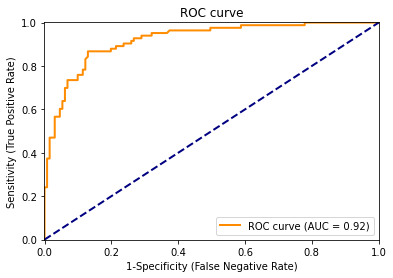

                                   Accuracy SVM: 0.8364485981308412
                   SENSITIVITY (aka RECALL) SVM: 0.7349397590361446
                 SPECIFICITY (aka FALL-OUT) SVM: 0.9007633587786259
 POSITIVE PREDICTIVE VALUE, (aka PRECISION) SVM: 0.8243243243243243
                 NEGATIVE PREDICTIVE VALUE) SVM: 0.8428571428571429


In [25]:
## Performance Measures
#Confusion Matrix
cm_svm = np.transpose(confusion_matrix(y_test, y_pred_svm))
print("\nConfusion matrix SVM: \n" + str(cm_svm))

#Auc Calculation
auc_svm = roc_auc_score(y_test, y_pred_prob_svm)
print("\nAUC SVM:  " + str(auc_svm))

#ROC plot
plot_roc(y_test, y_pred_prob_svm)

#Other Performance Metrics
print("                                   Accuracy SVM: " + str(custom_accuracy_score(y_test, y_pred_svm))) 
print("                   SENSITIVITY (aka RECALL) SVM: " + str(custom_sensitivity_score(y_test, y_pred_svm)))
print("                 SPECIFICITY (aka FALL-OUT) SVM: " + str(custom_specificity_score(y_test, y_pred_svm)))
print(" POSITIVE PREDICTIVE VALUE, (aka PRECISION) SVM: " + str(custom_ppv_score(y_test, y_pred_svm)))
print("                 NEGATIVE PREDICTIVE VALUE) SVM: " + str(custom_npv_score(y_test, y_pred_svm)))